<h3 align=center><font size = 5>Visulization of NewYork city crimes from the year 2014 to year 2019 based on borough and based on precincts</font></h3>


# Introduction
>**In this  notebook the geographical coordinates of 
>NewYork Police Precincts for each borough and the neighborhoods they serve is obtained  using Foursquare API
>and displayed  using Folium maps**

>**NYPD Complaint Data Historic is loaded from NYC open data.This dataset includes all valid felony,
misdemeanour, and violation crimes reported to the New York City Police Department (NYPD) from 2006 to the end of year 2019
As the file size is more than 2GB ,ihave used NEwyork crime dataa which is filtered for years 2013,2014,2015 and available at Kaggle**

## 1.Loading and Exploring the  data
>**1.The geojson file  of Newyork city boroughs is used   and Precincts are overlapped  on it using Folium visualization. 
>GEOJSON file which defines NewYork cityborough boundaries  is available at NYC Open Data.
>It is downloaded(Neighborhood Tabulation Areas (NTA))
>[NTA](https://data.cityofnewyork.us/City-Government/Neighborhood-Tabulation-Areas-NTA-/cpf4-rkhq)**


>**2.We need dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the the latitude and logitude coordinates of each neighborhood. 
>The data is downloaded (https://geo.nyu.edu/catalog/nyu_2451_34572)**

>**All dependecies are installed and libraries are imported**

In [1]:
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
import json # library to handle JSON files
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from io import BytesIO


In [2]:
!conda install -c conda-forge folium=0.11.0 --yes # the Foursquare API 
import folium # map rendering library

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - folium=0.11.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    folium-0.11.0              |             py_0          61 KB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    certifi-2020.6.20          |   py36h9f0ad1d_0         151 KB  conda-forge
    branca-0.4.1               |             py_0          26 KB  conda-forge
    openssl-1.1.1g             |       h516909a_0         2.1 MB  conda-forge
    ca-certificates-2020.6.20  |       hecda079_0         145 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    branca:          0.4.1-py_0        conda-forge
    folium:   

In [3]:
!conda install -c conda-forge geopy --yes #  the Foursquare API 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-2.0.0                |     pyh9f0ad1d_0          63 KB  conda-forge
    ------------------------------------------------------------
                                           Total:          97 KB

The following NEW packages will be INSTALLED:

    geographiclib: 1.50-py_0          conda-forge
    geopy:         2.0.0-pyh9f0ad1d_0 conda-forge


geographiclib-1.50   | 34 KB     | ##################################### | 100% 
geopy-2.0.0          | 63 KB     | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: done


>Define Foursquare Credentials and Version

In [4]:
# The code was removed by Watson Studio for sharing.

In [5]:
# The code was removed by Watson Studio for sharing.

>**the Newyork city Borough and neighborhood dataset is downloaded and loaded into server**

In [6]:
# The code was removed by Watson Studio for sharing.

,bbox,crs,features,totalFeatures,type
0,"[-74.2492599487305, 40.5033187866211, -73.7061...","{'type': 'name', 'properties': {'name': 'urn:o...","[{'type': 'Feature', 'id': 'nyu_2451_34572.1',...",306,FeatureCollection


>All the data is in features column

>All the relevant data is in the features key, which is basically a list of the neighborhoods. 
>Define a new variable that includes this data

In [7]:
neighborhoods_data = df_data['features']

In [153]:
#neighborhoods_data[0]

>Tranform the data into a pandas dataframe


In [8]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

>Then let's loop through the data and fill the dataframe one row at a time.

In [9]:
for data in neighborhoods_data[0]:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [10]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [11]:
neighborhoods.dtypes

Borough          object
Neighborhood     object
Latitude        float64
Longitude       float64
dtype: object

In [12]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [13]:
np.unique(neighborhoods['Borough'])

array(['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island'],
      dtype=object)

> slice the original dataframe and create a new dataframe for each borough.

In [14]:
bronx_data = neighborhoods[neighborhoods['Borough'] == 'Bronx'].reset_index(drop=True)
bronx_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [15]:
brooklyn_data = neighborhoods[neighborhoods['Borough'] == 'Brooklyn'].reset_index(drop=True)
brooklyn_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Brooklyn,Bay Ridge,40.625801,-74.030621
1,Brooklyn,Bensonhurst,40.611009,-73.995180
2,Brooklyn,Sunset Park,40.645103,-74.010316
3,Brooklyn,Greenpoint,40.730201,-73.954241
4,Brooklyn,Gravesend,40.595260,-73.973471


In [16]:
manhattan_data = neighborhoods[neighborhoods['Borough'] == 'Manhattan'].reset_index(drop=True)
manhattan_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Manhattan,Marble Hill,40.876551,-73.910660
1,Manhattan,Chinatown,40.715618,-73.994279
2,Manhattan,Washington Heights,40.851903,-73.936900
3,Manhattan,Inwood,40.867684,-73.921210
4,Manhattan,Hamilton Heights,40.823604,-73.949688


In [17]:
queens_data = neighborhoods[neighborhoods['Borough'] == 'Queens'].reset_index(drop=True)
queens_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Queens,Astoria,40.768509,-73.915654
1,Queens,Woodside,40.746349,-73.901842
2,Queens,Jackson Heights,40.751981,-73.882821
3,Queens,Elmhurst,40.744049,-73.881656
4,Queens,Howard Beach,40.654225,-73.838138


In [18]:
staten_data = neighborhoods[neighborhoods['Borough'] == 'Staten Island'].reset_index(drop=True)
staten_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Staten Island,St. George,40.644982,-74.079353
1,Staten Island,New Brighton,40.640615,-74.087017
2,Staten Island,Stapleton,40.626928,-74.077902
3,Staten Island,Rosebank,40.615305,-74.069805
4,Staten Island,West Brighton,40.631879,-74.107182


In [19]:
# define the precincts dataframe columns
column_names = ['Borough', 'Neighborhood','Neighborhood Latitude','Neighborhood Longitude','Precinct', 'Precinct Latitude', 'Precinct Longitude'] 

# instantiate the dataframe
precincts = pd.DataFrame(columns=column_names)

>Function is created  to  get the Police precincts  in Borough within a radius of 1000 meters.
>and it returns precincts for each of  the neighborhoods in the borough

In [20]:
LIMIT=10
def getNearbyPrecincts(borough,names, latitudes, longitudes, radius=1000):
    
    precincts_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
       # print(name)
        
        url ='https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&intent=browse&query=NYPD Precinct'.format(
               CLIENT_ID, 
               CLIENT_SECRET, 
               VERSION, 
               lat, 
               lng,
               radius,
               LIMIT) 
         # make the GET request
        results = requests.get(url).json()["response"]['venues']
        
        # return only relevant information for each nearby precinct
        precincts_list.append([(borough,
            name, 
            lat, 
            lng, 
            v['name'], 
            v['location']['lat'], 
            v['location']['lng'])
             for v in results])
           
              
       
    nearby_precincts = pd.DataFrame([item for precincts_list in precincts_list for item in precincts_list])
    nearby_precincts.columns = ['Borough','Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Precinct', 
                  'Precinct Latitude', 
                  'Precinct Longitude']
    return(nearby_precincts)            

>Now write the code to run the above function on each neighborhood of borough Bronx and create
>a new dataframe called bronx_precincts.and repeat for other boroughs

In [21]:
bronx_precincts = getNearbyPrecincts(borough='Bronx',names=bronx_data['Neighborhood'],
                                   latitudes=bronx_data['Latitude'],
                                   longitudes=bronx_data['Longitude']
                                  )

In [22]:
bronx_precincts.head()

,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Precinct,Precinct Latitude,Precinct Longitude
0,Bronx,Wakefield,40.894705,-73.847201,NYPD - 47th Precinct,40.887270,-73.847293
1,Bronx,Co-op City,40.874294,-73.829939,NYPD Seized Property Lot,40.869439,-73.827791
2,Bronx,Kingsbridge,40.881687,-73.902818,NYPD - 50th Precinct,40.883651,-73.902314
3,Bronx,Kingsbridge,40.881687,-73.902818,Nypd 55th Precinct,40.880930,-73.902126
4,Bronx,Kingsbridge,40.881687,-73.902818,MD 3-NYPD-50 Precinct,40.883369,-73.902306


In [23]:
bronx_precincts.shape

(85, 7)

In [24]:
brooklyn_precincts = getNearbyPrecincts(borough='Brooklyn',names=brooklyn_data['Neighborhood'],
                                   latitudes=brooklyn_data['Latitude'],
                                   longitudes=brooklyn_data['Longitude']
                                  )

In [25]:
brooklyn_precincts.head()

,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Precinct,Precinct Latitude,Precinct Longitude
0,Brooklyn,Bay Ridge,40.625801,-74.030621,68th Precinct Field,40.627708,-74.038990
1,Brooklyn,Sunset Park,40.645103,-74.010316,NYPD - Applicant Processing division,40.650485,-74.007940
2,Brooklyn,Sunset Park,40.645103,-74.010316,68th Police Precinct Station House and Stable,40.650443,-74.008902
3,Brooklyn,Greenpoint,40.730201,-73.954241,NYPD - 94th Precinct,40.726834,-73.953393
4,Brooklyn,Gravesend,40.595260,-73.973471,NYPD Pistol Range,40.589651,-73.974127


In [26]:
brooklyn_precincts.shape

(99, 7)

In [27]:
manhattan_precincts=getNearbyPrecincts(borough='Manhattan',names=manhattan_data['Neighborhood'],
                                   latitudes=manhattan_data['Latitude'],
                                   longitudes=manhattan_data['Longitude'])

In [28]:
manhattan_precincts.head()

,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Precinct,Precinct Latitude,Precinct Longitude
0,Manhattan,Marble Hill,40.876551,-73.910660,Nypd 55th Precinct,40.880930,-73.902126
1,Manhattan,Chinatown,40.715618,-73.994279,NYPD - 5th Precinct,40.716097,-73.997252
2,Manhattan,Chinatown,40.715618,-73.994279,NYPD - 7th Precinct,40.716392,-73.983726
3,Manhattan,Chinatown,40.715618,-73.994279,NYPD - 12th Precinct (Blue Bloods),40.715900,-74.000532
4,Manhattan,Chinatown,40.715618,-73.994279,5th precinct gym,40.716188,-73.997493


In [29]:
manhattan_precincts.shape

(185, 7)

In [30]:
queens_precincts=getNearbyPrecincts(borough='Queens',names=queens_data['Neighborhood'],
                                   latitudes=queens_data['Latitude'],
                                   longitudes=queens_data['Longitude'])

In [31]:
queens_precincts.head()

,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Precinct,Precinct Latitude,Precinct Longitude
0,Queens,Astoria,40.768509,-73.915654,NYPD - 114th Precinct,40.769508,-73.915360
1,Queens,Astoria,40.768509,-73.915654,114 Precinct Gym,40.770478,-73.917660
2,Queens,Astoria,40.768509,-73.915654,Precinct Lounge,40.769371,-73.915542
3,Queens,Jackson Heights,40.751981,-73.882821,NYPD - 115th Precinct,40.756777,-73.875275
4,Queens,Corona,40.742382,-73.856825,NYPD District Surgeon,40.735096,-73.862541


In [32]:
queens_precincts.shape

(66, 7)

In [33]:
staten_precincts=getNearbyPrecincts(borough='Staten Island',names=staten_data['Neighborhood'],
                                   latitudes=staten_data['Latitude'],
                                   longitudes=staten_data['Longitude'])

In [34]:
staten_precincts.head()

,Borough,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Precinct,Precinct Latitude,Precinct Longitude
0,Staten Island,St. George,40.644982,-74.079353,NYPD - 120th Precinct,40.644676,-74.077153
1,Staten Island,New Brighton,40.640615,-74.087017,NYPD - 120th Precinct,40.644676,-74.077153
2,Staten Island,Stapleton,40.626928,-74.077902,NYPD Midtown South,40.625015,-74.083255
3,Staten Island,Rosebank,40.615305,-74.069805,NYPD 31 Precinct,40.620127,-74.069584
4,Staten Island,Grymes Hill,40.624185,-74.087248,NYPD Midtown South,40.625015,-74.083255


In [35]:
staten_precincts.shape

(21, 7)

>A function is defined to clean repeated and unwanted rows 

In [36]:
#cleaning the data which has unwanted detalis and grouping  based on precincts 
def clean_df(df,columns):
    df_reg = pd.DataFrame(columns=columns)
    df_final=pd.DataFrame()
    df_reg=(df[df['Precinct'].str.contains('NYPD -.*Precinct$', regex= True, na=False)]).reset_index(drop=True)
    df_final=df_reg.groupby(['Precinct','Precinct Latitude','Precinct Longitude','Borough'])['Neighborhood'].apply(','.join).reset_index()
    return(df_final)

>clean each dataframe by calling the function clean_df which extracts only data which matches "NYPD Precinct"

In [37]:
df_BX=clean_df(bronx_precincts,list(bronx_precincts.columns))

>Each dataframe is carefully observed ,duplicates and wrong data entries are removed

In [38]:
df_BX

,Precinct,Precinct Latitude,Precinct Longitude,Borough,Neighborhood
0,NYPD - 33rd Precinct,40.841311,-73.935710,Bronx,High Bridge
1,NYPD - 40th Precinct,40.810369,-73.925339,Bronx,Mott Haven
2,NYPD - 41st Precinct,40.816173,-73.895596,Bronx,"Longwood,Morrisania"
3,NYPD - 42nd Precinct,40.822231,-73.911447,Bronx,"Melrose,Morrisania,Concourse Village"
4,NYPD - 43rd Precinct,40.823195,-73.870354,Bronx,Soundview
5,NYPD - 44th Precinct,40.837659,-73.920010,Bronx,"High Bridge,Concourse,Mount Eden"
6,NYPD - 45th Precinct,40.830830,-73.827246,Bronx,Schuylerville
7,NYPD - 46th Precinct,40.854192,-73.900279,Bronx,"University Heights,Fordham,Mount Hope"
8,NYPD - 47th Precinct,40.887270,-73.847293,Bronx,"Wakefield,Edenwald"
9,NYPD - 48th Precinct,40.844134,-73.900270,Bronx,Mount Hope


In [39]:
df_BX.shape

(13, 5)

In [40]:
df_BK=clean_df(brooklyn_precincts,list(brooklyn_precincts.columns))

In [41]:
df_BK

,Precinct,Precinct Latitude,Precinct Longitude,Borough,Neighborhood
0,NYPD - 60th Precinct,40.576508,-73.976517,Brooklyn,Brighton Beach
1,NYPD - 61st Precinct,40.594119,-73.960828,Brooklyn,Homecrest
2,NYPD - 62nd Precinct,40.602339,-74.003089,Brooklyn,Bath Beach
3,NYPD - 66th Precinct,40.625653,-73.991293,Brooklyn,Borough Park
4,NYPD - 67th Precinct,40.648796,-73.950307,Brooklyn,Erasmus
5,NYPD - 71st Precinct,40.664657,-73.948237,Brooklyn,"Crown Heights,Prospect Lefferts Gardens"
6,NYPD - 73rd Precinct,40.670889,-73.913899,Brooklyn,"Brownsville,Ocean Hill"
7,NYPD - 75th Precinct,40.671193,-73.881505,Brooklyn,"East New York,New Lots"
8,NYPD - 76th Precinct,40.623867,-74.013386,Brooklyn,Dyker Heights
9,NYPD - 76th Precinct,40.683614,-74.000185,Brooklyn,"Cobble Hill,Carroll Gardens"


>There are two entries with 76thand 78th precinct with different coordinates.these rows are dropped

In [42]:
df_BK.drop([8,11],inplace=True)

In [43]:
df_BK.shape

(18, 5)

In [44]:
df_MH=clean_df(manhattan_precincts,list(manhattan_precincts.columns))

In [45]:
df_MH

,Precinct,Precinct Latitude,Precinct Longitude,Borough,Neighborhood
0,NYPD - 10th Precinct,40.742876,-73.998551,Manhattan,"Chelsea,Flatiron"
1,NYPD - 13th Precinct,40.736980,-73.982771,Manhattan,"Gramercy,Stuyvesant Town,Flatiron"
2,NYPD - 17th Precinct,40.756657,-73.970653,Manhattan,"Midtown,Sutton Place,Turtle Bay"
3,NYPD - 18th Precinct,40.742844,-73.998639,Manhattan,"Chelsea,Flatiron"
4,NYPD - 19th Precinct,40.767065,-73.963994,Manhattan,"Upper East Side,Lenox Hill,Sutton Place"
5,NYPD - 1st Precinct,40.720384,-74.006939,Manhattan,"Greenwich Village,Tribeca,Little Italy,Soho,Ci..."
6,NYPD - 20th Precinct,40.784382,-73.975109,Manhattan,Upper West Side
7,NYPD - 21st Precinct,40.751031,-73.986099,Manhattan,"Midtown,Murray Hill,Midtown South"
8,NYPD - 23rd Precinct,40.789068,-73.946818,Manhattan,"East Harlem,Carnegie Hill"
9,NYPD - 24th Precinct,40.794691,-73.967040,Manhattan,Manhattan Valley


>NYPD 18,21 precincts are wrong entries which are at location 3 and 7.
>NYPD 6 is repeated with different coordinates.these rows are dropped

In [46]:
df_MH.drop([3,7,17],inplace=True)

In [47]:
df_MH.shape

(21, 5)

In [48]:
df_QN=clean_df(queens_precincts,list(queens_precincts.columns))

In [49]:
df_QN

,Precinct,Precinct Latitude,Precinct Longitude,Borough,Neighborhood
0,NYPD - 100th Precinct,40.586116,-73.816388,Queens,"Rockaway Beach,Hammels"
1,NYPD - 101st Precinct,40.602880,-73.750293,Queens,Far Rockaway
2,NYPD - 102nd Precinct,40.698531,-73.831397,Queens,"Kew Gardens,Richmond Hill"
3,NYPD - 103rd Precinct,40.707219,-73.792499,Queens,"Jamaica Center,Jamaica Hills"
4,NYPD - 104th Precinct,40.704351,-73.893868,Queens,Ridgewood
5,NYPD - 105th Precinct,40.726319,-73.734839,Queens,"Queens Village,Bellaire"
6,NYPD - 106th Precinct,40.682180,-73.839992,Queens,Ozone Park
7,NYPD - 107th Precinct,40.730243,-73.810738,Queens,Pomonok
8,NYPD - 108th Precinct,40.742804,-73.954499,Queens,Hunters Point
9,NYPD - 109th Precinct,40.762257,-73.827386,Queens,Flushing


In [50]:
df_QN.shape

(15, 5)

In [51]:
df_ST=clean_df(staten_precincts,list(staten_precincts.columns))

In [52]:
df_ST

,Precinct,Precinct Latitude,Precinct Longitude,Borough,Neighborhood
0,NYPD - 120th Precinct,40.644676,-74.077153,Staten Island,"St. George,New Brighton,Tompkinsville"
1,NYPD - 121st Precinct,40.623756,-74.151123,Staten Island,"Mariner's Harbor,Graniteville"
2,NYPD - 122nd Precinct,40.573825,-74.105777,Staten Island,"New Dorp,Grant City"
3,NYPD - 122nd Precinct,40.574027,-74.105778,Staten Island,"New Dorp,Grant City"
4,NYPD - 123rd Precinct,40.511849,-74.249992,Staten Island,Tottenville


>Precinct 122 is repeated with different coordinates.row at index 2 is deleted

In [53]:
df_ST.drop(2,inplace=True)

In [54]:
df_ST.shape

(4, 5)

>The final Dataframe of Precincts data which combines all the dataframes into one dataframe

In [55]:
NY_precincts=pd.concat([df_BX,df_BK,df_MH,df_QN,df_ST],ignore_index=True)

In [56]:
NY_precincts.head()

,Precinct,Precinct Latitude,Precinct Longitude,Borough,Neighborhood
0,NYPD - 33rd Precinct,40.841311,-73.935710,Bronx,High Bridge
1,NYPD - 40th Precinct,40.810369,-73.925339,Bronx,Mott Haven
2,NYPD - 41st Precinct,40.816173,-73.895596,Bronx,"Longwood,Morrisania"
3,NYPD - 42nd Precinct,40.822231,-73.911447,Bronx,"Melrose,Morrisania,Concourse Village"
4,NYPD - 43rd Precinct,40.823195,-73.870354,Bronx,Soundview


In [57]:
NY_precincts.shape

(71, 5)

>Total 71 Precincts Loctions are extracted from Foursquare API.some precinct data is not loaded while extracting using Foursquare

In [58]:
#NY_precincts.to_json (r'\NY_precincts.json', orient='table')

>Obtaining Geographical coordinates of NEWYORK city 

In [59]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
NY_latitude = location.latitude
NY_longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(NY_latitude, NY_longitude))


The geograpical coordinate of New York City are 40.7127281, -74.0060152.


>Geojson file for Newyork borough boundaries is loaded 

In [63]:

# Your data file was loaded into a botocore.response.StreamingBody object.
# Please read the documentation of ibm_boto3 and pandas to learn more about the possibilities to load the data.
# ibm_boto3 documentation: https://ibm.github.io/ibm-cos-sdk-python/
# pandas documentation: http://pandas.pydata.org/
streaming_body_5 = client_39b0704d64734c2a93f752ce733d60dc.get_object(Bucket='battleofneighborhoods-donotdelete-pr-boqlx7nqe3wunh', Key='Borough Boundaries.geojson')['Body']
# add missing __iter__ method so pandas accepts body as file-like object
if not hasattr(streaming_body_5, "__iter__"): streaming_body_5.__iter__ = types.MethodType( __iter__, streaming_body_5 ) 
readrawdata = streaming_body_5.read()


In [64]:
from io import BytesIO
import json

df_bor=json.load(BytesIO(readrawdata))


In [65]:
type(df_bor)

dict

>All the inforamtion is in features data 

In [152]:
#df_bor["features"][0]

>creating  a map of Newyork City

In [67]:
NY_map = folium.Map(location=[NY_latitude, NY_longitude], tiles='OpenStreetMap',zoom_start=10)

>Overlapping the Precincts Geographical coordinates on Newyork map

In [69]:
precincts = folium.map.FeatureGroup()
loc = 'NewYork Police Divisions location map '
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)   
   
for lat, lng, in zip(NY_precincts['Precinct Latitude'], NY_precincts['Precinct Longitude']):
    precincts.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )
latitudes = list(NY_precincts['Precinct Latitude'])
longitudes = list(NY_precincts['Precinct Longitude'])
labels = list(NY_precincts.Precinct)
for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker([lat, lng], popup=label).add_to(NY_map)    
    
# add precincts to map
NY_map.add_child(precincts)
NY_map.get_root().html.add_child(folium.Element(title_html))
    

NY_map


In [70]:
# generate choropleth map using the GEOJason of NewYork
NY_map.choropleth(geo_data=df_bor, line_color='yellow',line_weight=1, legend_name='NewYork Neighborhoods',
                  highlight=True)
                 

          
   # display map

NY_map

/opt/conda/envs/Python36/lib/python3.6/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


>Download the Newyork city crime dataset which is available in Kaggle  for years 2013 to 2015 and read it into a pandas dataframe:

In [71]:
# The code was removed by Watson Studio for sharing.

/opt/conda/envs/Python36/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,RPT_DT,KY_CD,OFNS_DESC,PD_CD,PD_DESC,...,ADDR_PCT_CD,LOC_OF_OCCUR_DESC,PREM_TYP_DESC,PARKS_NM,HADEVELOPT,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon
0,101109527,12/31/2015,23:45:00,NaN,NaN,12/31/2015,113,FORGERY,729.0,"FORGERY,ETC.,UNCLASSIFIED-FELO",...,44.0,INSIDE,BAR/NIGHT CLUB,NaN,NaN,1007314.0,241257.0,40.828848,-73.916661,"(40.828848333, -73.916661142)"
1,153401121,12/31/2015,23:36:00,NaN,NaN,12/31/2015,101,MURDER & NON-NEGL. MANSLAUGHTER,NaN,NaN,...,103.0,OUTSIDE,NaN,NaN,NaN,1043991.0,193406.0,40.697338,-73.784557,"(40.697338138, -73.784556739)"
2,569369778,12/31/2015,23:30:00,NaN,NaN,12/31/2015,117,DANGEROUS DRUGS,503.0,"CONTROLLED SUBSTANCE,INTENT TO",...,28.0,NaN,OTHER,NaN,NaN,999463.0,231690.0,40.802607,-73.945052,"(40.802606608, -73.945051911)"
3,968417082,12/31/2015,23:30:00,NaN,NaN,12/31/2015,344,ASSAULT 3 & RELATED OFFENSES,101.0,ASSAULT 3,...,105.0,INSIDE,RESIDENCE-HOUSE,NaN,NaN,1060183.0,177862.0,40.654549,-73.726339,"(40.654549444, -73.726338791)"
4,641637920,12/31/2015,23:25:00,12/31/2015,23:30:00,12/31/2015,344,ASSAULT 3 & RELATED OFFENSES,101.0,ASSAULT 3,...,13.0,FRONT OF,OTHER,NaN,NaN,987606.0,208148.0,40.738002,-73.987891,"(40.7380024, -73.98789129)"


>Analyzing the data

In [72]:
df_NYCrime.shape

(1048575, 24)

In [73]:
df_NYCrime.columns.values

array(['CMPLNT_NUM', 'CMPLNT_FR_DT', 'CMPLNT_FR_TM', 'CMPLNT_TO_DT',
       'CMPLNT_TO_TM', 'RPT_DT', 'KY_CD', 'OFNS_DESC', 'PD_CD', 'PD_DESC',
       'CRM_ATPT_CPTD_CD', 'LAW_CAT_CD', 'JURIS_DESC', 'BORO_NM',
       'ADDR_PCT_CD', 'LOC_OF_OCCUR_DESC', 'PREM_TYP_DESC', 'PARKS_NM',
       'HADEVELOPT', 'X_COORD_CD', 'Y_COORD_CD', 'Latitude', 'Longitude',
       'Lat_Lon'], dtype=object)

In [74]:
df_NYCrime.dtypes

CMPLNT_NUM             int64
CMPLNT_FR_DT          object
CMPLNT_FR_TM          object
CMPLNT_TO_DT          object
CMPLNT_TO_TM          object
RPT_DT                object
KY_CD                  int64
OFNS_DESC             object
PD_CD                float64
PD_DESC               object
CRM_ATPT_CPTD_CD      object
LAW_CAT_CD            object
JURIS_DESC            object
BORO_NM               object
ADDR_PCT_CD          float64
LOC_OF_OCCUR_DESC     object
PREM_TYP_DESC         object
PARKS_NM              object
HADEVELOPT            object
X_COORD_CD           float64
Y_COORD_CD           float64
Latitude             float64
Longitude            float64
Lat_Lon               object
dtype: object

>Checking for Missing values

In [75]:
missing_data = df_NYCrime.isnull()

In [76]:
missing_data.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,RPT_DT,KY_CD,OFNS_DESC,PD_CD,PD_DESC,...,ADDR_PCT_CD,LOC_OF_OCCUR_DESC,PREM_TYP_DESC,PARKS_NM,HADEVELOPT,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon
0,False,False,False,True,True,False,False,False,False,False,...,False,False,False,True,True,False,False,False,False,False
1,False,False,False,True,True,False,False,False,True,True,...,False,False,True,True,True,False,False,False,False,False
2,False,False,False,True,True,False,False,False,False,False,...,False,True,False,True,True,False,False,False,False,False
3,False,False,False,True,True,False,False,False,False,False,...,False,False,False,True,True,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,True,False,False,False,False,False


In [77]:
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("")    

CMPLNT_NUM
False    1048575
Name: CMPLNT_NUM, dtype: int64

CMPLNT_FR_DT
False    1048510
True          65
Name: CMPLNT_FR_DT, dtype: int64

CMPLNT_FR_TM
False    1048575
Name: CMPLNT_FR_TM, dtype: int64

CMPLNT_TO_DT
False    842616
True     205959
Name: CMPLNT_TO_DT, dtype: int64

CMPLNT_TO_TM
False    843002
True     205573
Name: CMPLNT_TO_TM, dtype: int64

RPT_DT
False    1048575
Name: RPT_DT, dtype: int64

KY_CD
False    1048575
Name: KY_CD, dtype: int64

OFNS_DESC
False    1045695
True        2880
Name: OFNS_DESC, dtype: int64

PD_CD
False    1047842
True         733
Name: PD_CD, dtype: int64

PD_DESC
False    1047842
True         733
Name: PD_DESC, dtype: int64

CRM_ATPT_CPTD_CD
False    1048574
True           1
Name: CRM_ATPT_CPTD_CD, dtype: int64

LAW_CAT_CD
False    1048575
Name: LAW_CAT_CD, dtype: int64

JURIS_DESC
False    1048575
Name: JURIS_DESC, dtype: int64

BORO_NM
False    1048575
Name: BORO_NM, dtype: int64

ADDR_PCT_CD
False    1048574
True           1
Name: ADDR_PC

In [78]:
# simply drop whole rows with NaN in "Lat_Lon" and ADDR_PCT_CD columns
df_NYCrime.dropna(subset=["Lat_Lon","ADDR_PCT_CD","OFNS_DESC"], axis=0, inplace=True)

# reset index, because we droped  rows
df_NYCrime.reset_index(drop=True, inplace=True)

In [79]:
df_NYCrime.shape

(1013367, 24)

In [80]:
#In this dataset we are intrested in only ,Borough, Reported date ,Precinct and Level of offence and coordinates .removing unwanted columns 
df_NYCrime.drop(['CMPLNT_FR_DT','CMPLNT_FR_TM','CMPLNT_TO_DT','CMPLNT_TO_TM','KY_CD', 'OFNS_DESC', 'PD_CD', 'PD_DESC','CRM_ATPT_CPTD_CD','JURIS_DESC','LOC_OF_OCCUR_DESC', 'PREM_TYP_DESC', 'PARKS_NM','HADEVELOPT','X_COORD_CD','Y_COORD_CD','Lat_Lon'],axis=1,inplace=True)

In [81]:
df_NYCrime.head()

,CMPLNT_NUM,RPT_DT,LAW_CAT_CD,BORO_NM,ADDR_PCT_CD,Latitude,Longitude
0,101109527,12/31/2015,FELONY,BRONX,44.0,40.828848,-73.916661
1,153401121,12/31/2015,FELONY,QUEENS,103.0,40.697338,-73.784557
2,569369778,12/31/2015,FELONY,MANHATTAN,28.0,40.802607,-73.945052
3,968417082,12/31/2015,MISDEMEANOR,QUEENS,105.0,40.654549,-73.726339
4,641637920,12/31/2015,MISDEMEANOR,MANHATTAN,13.0,40.738002,-73.987891


In [82]:
#Convert_'RPT_DT' to datetime.datetime  format and 'ADDR_PCT_CD' to int
df_NYCrime['RPT_DT']=pd.to_datetime(df_NYCrime['RPT_DT'], infer_datetime_format=True)
df_NYCrime=df_NYCrime.astype({'ADDR_PCT_CD':int})

print(df_NYCrime.dtypes)


CMPLNT_NUM              int64
RPT_DT         datetime64[ns]
LAW_CAT_CD             object
BORO_NM                object
ADDR_PCT_CD             int64
Latitude              float64
Longitude             float64
dtype: object


In [83]:
df_NYCrime['RPT_year'] =(df_NYCrime['RPT_DT']).dt.year

In [84]:
df_NYCrime['LAW_CAT_CD'].unique()

array(['FELONY', 'MISDEMEANOR', 'VIOLATION'], dtype=object)

In [85]:
df_NYCrime['RPT_year'].unique()

array([2015, 2014, 2013])

In [86]:
df_NYCrime['BORO_NM'].unique()

array(['BRONX', 'QUEENS', 'MANHATTAN', 'BROOKLYN', 'STATEN ISLAND'],
      dtype=object)

>Now the dataset is ready for analysing 

>Considering only 2015 data 

In [87]:
df_NYCrime1=df_NYCrime[df_NYCrime['RPT_year']==2015]

In [88]:
df_NYCrime1['RPT_month'] =df_NYCrime1['RPT_DT'].dt.month

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [90]:
import calendar
df_NYCrime1['Month'] = df_NYCrime1['RPT_month'].apply(lambda x: calendar.month_name[x])

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [91]:
len(df_NYCrime1['RPT_DT'].unique())#which says that all the days of 2015 is availabel

365

In [92]:
df_NYCrime1.shape

(467461, 10)

In [93]:
df_NYCrime1.head()

,CMPLNT_NUM,RPT_DT,LAW_CAT_CD,BORO_NM,ADDR_PCT_CD,Latitude,Longitude,RPT_year,RPT_month,Month
0,101109527,2015-12-31,FELONY,BRONX,44,40.828848,-73.916661,2015,12,December
1,153401121,2015-12-31,FELONY,QUEENS,103,40.697338,-73.784557,2015,12,December
2,569369778,2015-12-31,FELONY,MANHATTAN,28,40.802607,-73.945052,2015,12,December
3,968417082,2015-12-31,MISDEMEANOR,QUEENS,105,40.654549,-73.726339,2015,12,December
4,641637920,2015-12-31,MISDEMEANOR,MANHATTAN,13,40.738002,-73.987891,2015,12,December


>NewYork Monthly crimes in 2015

In [94]:
df_NYCrimemonth=df_NYCrime1.groupby(['Month'],as_index=True).count()

In [95]:
df_NYCrimemonth.sort_index()
df_NYCrimemonth["crimecount"]=df_NYCrimemonth['CMPLNT_NUM']
df_NYCrimemonth.drop(['CMPLNT_NUM','RPT_DT','LAW_CAT_CD','BORO_NM','ADDR_PCT_CD','Latitude','Longitude','RPT_year','RPT_month'],axis=1,inplace=True)
df_NYCrimemonth

,crimecount
Month,
April,38985
August,44250
December,38394
February,30238
January,33080
July,43560
June,40897
March,36402
May,41554


In [96]:
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df_NYCrimemonth = df_NYCrimemonth.reindex(new_order, axis=0)

In [97]:
df_NYCrimemonth

,crimecount
Month,
January,33080
February,30238
March,36402
April,38985
May,41554
June,40897
July,43560
August,44250
September,41186


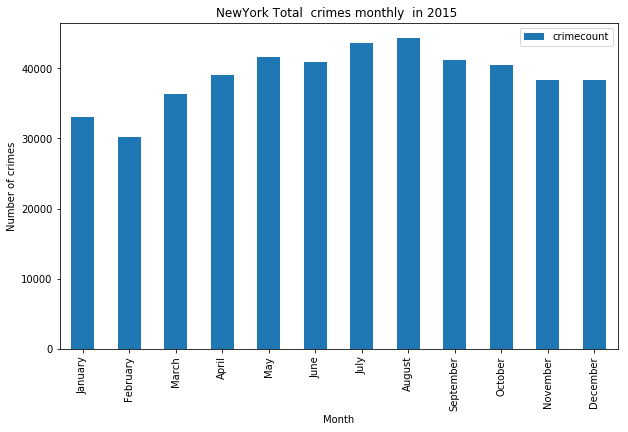

In [99]:
df_NYCrimemonth.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Month') # add to x-label to the plot
plt.ylabel('Number of crimes') # add y-label to the plot
plt.title('NewYork Total  crimes monthly  in 2015 ') # add title to the plot

plt.show()

In [100]:
df_NYcrimetest=df_NYCrime1.drop(['RPT_DT','Latitude','Longitude'],axis=1,inplace=False)

In [101]:
NY_crimediv= df_NYCrime1.groupby(['ADDR_PCT_CD','LAW_CAT_CD'],as_index=False).count()
NY_crimediv["count"]=NY_crimediv['CMPLNT_NUM']
NY_crimediv.drop(['CMPLNT_NUM','RPT_DT','BORO_NM','Latitude','Longitude','RPT_year','RPT_month','Month'],axis=1,inplace=True)
NY_crimediv.head()

,ADDR_PCT_CD,LAW_CAT_CD,count
0,1,FELONY,1743
1,1,MISDEMEANOR,3248
2,1,VIOLATION,543
3,5,FELONY,1291
4,5,MISDEMEANOR,2535


>Grouping the data based on reported year and crime type

In [102]:
NY_crimedivpivot=NY_crimediv.pivot_table(index='ADDR_PCT_CD',columns='LAW_CAT_CD')

In [103]:
NY_crimedivpivot.columns

MultiIndex(levels=[['count'], ['FELONY', 'MISDEMEANOR', 'VIOLATION']],
           codes=[[0, 0, 0], [0, 1, 2]],
           names=[None, 'LAW_CAT_CD'])

In [104]:
NY_crimedivpivot.head()

count                      
LAW_CAT_CD  FELONY MISDEMEANOR VIOLATION
ADDR_PCT_CD                             
1             1743        3248       543
5             1291        2535       406
6             1884        2614       392
7             1132        2254       574
9             1689        3190       546

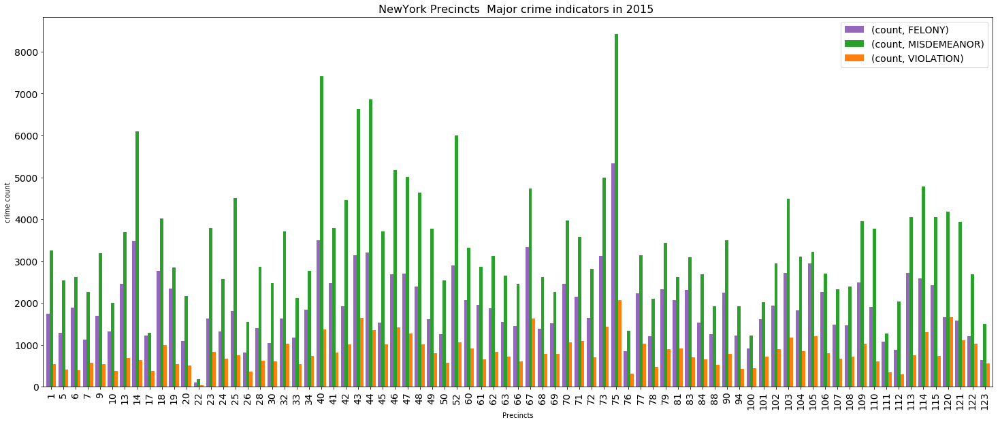

In [105]:
NY_crimedivpivot.plot(kind='bar',figsize=(25,10),width=0.8,color=('#9467bd','#2ca02c','#ff7f0e'),fontsize=14)
plt.title("NewYork Precincts  Major crime indicators in 2015 ",fontsize=16)
plt.xlabel("Precincts")
plt.ylabel("crime count")
plt.legend(fontsize=14)
plt.show()

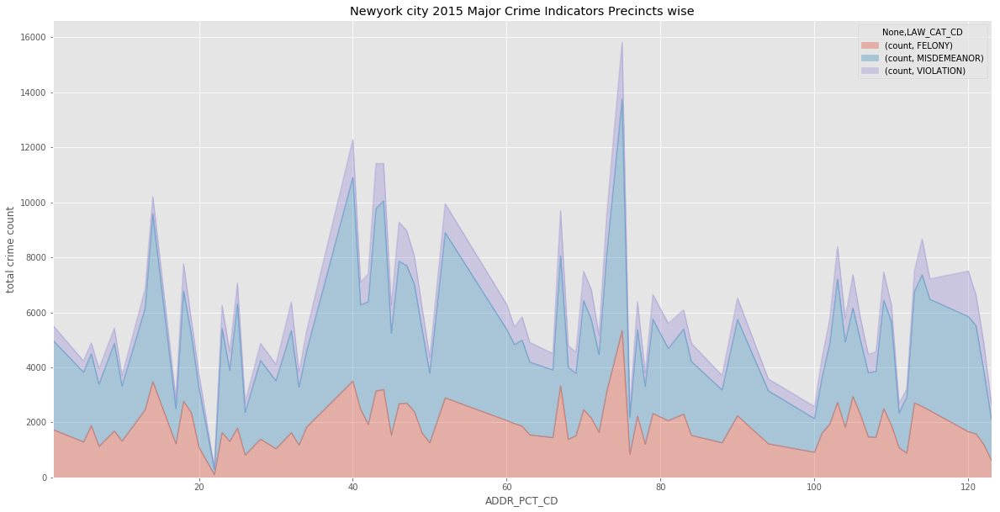

In [106]:
mpl.style.use('ggplot') 
NY_crimedivpivot.plot(kind='area', alpha=0.35, figsize=(20, 10))
plt.title('Newyork city 2015 Major Crime Indicators Precincts wise')
plt.ylabel('total crime count')
plt.show()

In [107]:
NYpct_crime=df_NYCrime1.groupby(['ADDR_PCT_CD'],as_index=True).count()
NYpct_crime["Total"]=NYpct_crime['CMPLNT_NUM']
NYpct_crime.drop(['CMPLNT_NUM','RPT_DT','LAW_CAT_CD','BORO_NM','Latitude','Longitude','RPT_year','RPT_month','Month'],axis=1,inplace=True)
NYpct_crime.head()

,Total
ADDR_PCT_CD,
1,5534
5,4232
6,4890
7,3960
9,5425


In [108]:
NYpct_crime.sort_values(by=['Total'], ascending=False, inplace=True)

In [109]:
NYpct_crime10=NYpct_crime.head(10)

In [110]:
NYpct_crime10

,Total
ADDR_PCT_CD,
75,15825
40,12280
44,11412
43,11411
14,10218
52,9953
67,9703
73,9555
46,9280


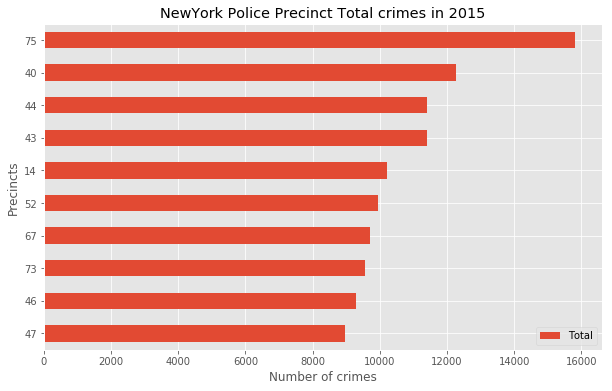

In [111]:
ax = NYpct_crime10.plot(kind='barh', figsize=(10, 6))
ax.set_title('NewYork Police Precinct Total crimes in 2015')
ax.set_ylabel('Precincts')
ax.set_xlabel('Number of crimes')
ax.invert_yaxis() 
plt.show()

In [112]:
df_NYCrimebr=df_NYCrime1.groupby(['BORO_NM'],as_index=True).count()
df_NYCrimebr["crimecount"]=df_NYCrimebr['CMPLNT_NUM']
df_NYCrimebr.drop(['ADDR_PCT_CD','CMPLNT_NUM','RPT_DT','LAW_CAT_CD','Latitude','Longitude','RPT_year','RPT_month','Month'],axis=1,inplace=True)

In [113]:
df_NYCrimebr.head()


,crimecount
BORO_NM,
BRONX,102629
BROOKLYN,140600
MANHATTAN,110383
QUEENS,92113
STATEN ISLAND,21736


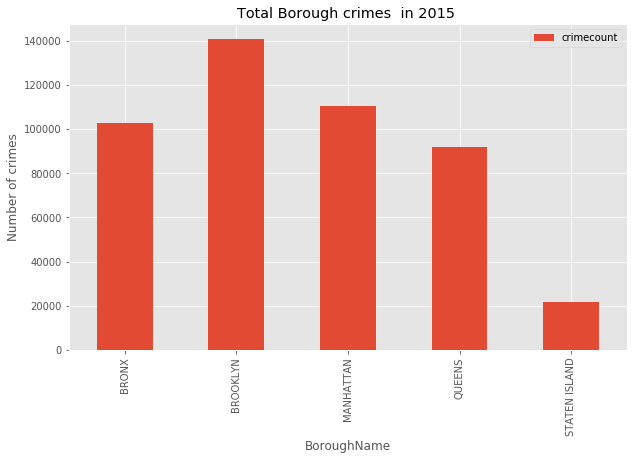

In [114]:
df_NYCrimebr.plot(kind='bar', figsize=(10, 6))

plt.xlabel('BoroughName') # add to x-label to the plot
plt.ylabel('Number of crimes') # add y-label to the plot
plt.title('Total Borough crimes  in 2015 ') # add title to the plot

plt.show()


In [115]:
df_NYCrimebr1=df_NYCrimebr.reset_index()
df_NYCrimebr1['BORO_NM'] = df_NYCrimebr1['BORO_NM'].str.title()
df_NYCrimebr1

,BORO_NM,crimecount
0,Bronx,102629
1,Brooklyn,140600
2,Manhattan,110383
3,Queens,92113
4,Staten Island,21736


In [117]:
df_NYpct=df_NYCrime1.groupby(['ADDR_PCT_CD'],as_index=True).count()
df_NYpct["crimecount"]=df_NYpct['CMPLNT_NUM']
df_NYpct.drop(['BORO_NM','CMPLNT_NUM','RPT_DT','LAW_CAT_CD','Latitude','Longitude','RPT_year','RPT_month','Month'],axis=1,inplace=True)
df_NYpct.head()

,crimecount
ADDR_PCT_CD,
1,5534
5,4232
6,4890
7,3960
9,5425


In [118]:
df_NYpct.sort_values(by=['crimecount'], ascending=False, inplace=True)

In [119]:
df_NYpct20=df_NYpct.head(20)

In [137]:
df_NYpct20.head(10)

,crimecount
ADDR_PCT_CD,
75,15825
40,12280
44,11412
43,11411
14,10218
52,9953
67,9703
73,9555
46,9280


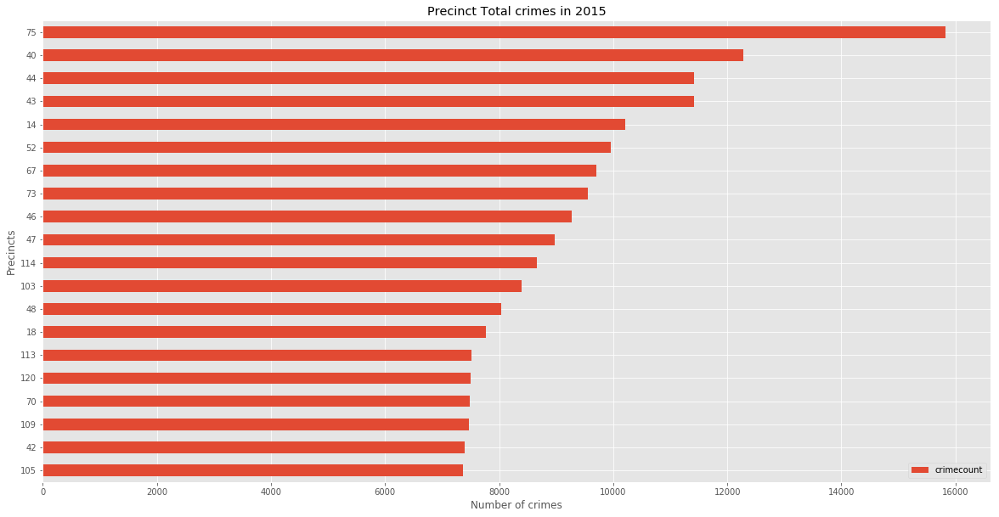

In [120]:
ax = df_NYpct20.plot(kind='barh', figsize=(20, 10))
ax.set_title('Precinct Total crimes in 2015')
ax.set_ylabel('Precincts')
ax.set_xlabel('Number of crimes')
ax.invert_yaxis() 
plt.show()



In [121]:
df_NYpct.dtypes

crimecount    int64
dtype: object

In [122]:
df_NYpct1=df_NYpct.reset_index()

In [123]:
df_NYpct1['ADDR_PCT_CD'] = df_NYpct1['ADDR_PCT_CD'].astype(str)

In [149]:
df_NYpct1.head()

,ADDR_PCT_CD,crimecount
0,75,15825
1,40,12280
2,44,11412
3,43,11411
4,14,10218


>**Visulization of Newyork city borough  crimes using Choropleth Maps in the year 2015**

In [126]:
threshold_scale = np.linspace(df_NYCrimebr1['crimecount'].min(),
                              df_NYCrimebr1['crimecount'].max(),
                              5, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

In [127]:
threshold_scale 

[21736, 51452, 81168, 110884, 140601]

In [130]:
from folium.features import GeoJson,GeoJsonPopup
loc = 'NewYork Borough crimes in 2015 Choropleth map  '
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)   
NY_map = folium.Map(location=[40.7127281,-74.0060152],tiles='Mapbox Bright', zoom_start=10)
popup = GeoJsonPopup(
    fields=['boro_name'],
    aliases=['Borough'],
    localize=True,
    labels=True,
    style="background-color: yellow;",
)

choropleth=folium.Choropleth(geo_data=df_bor,data=df_NYCrimebr1,columns=['BORO_NM', 'crimecount'],
    key_on='feature.properties.boro_name',fill_color='YlOrRd',bins=threshold_scale,
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Newyork crimecount',reset=True,highlight=True).add_to(NY_map)
popup.add_to(choropleth.geojson)
print(type(choropleth.geojson))
folium.LayerControl().add_to(NY_map)
NY_map.get_root().html.add_child(folium.Element(title_html))


NY_map



<class 'folium.features.GeoJson'>


>Precinct Boundaries geojson file is loaded

In [132]:
# The code was removed by Watson Studio for sharing.

In [133]:
from io import BytesIO
import json

df_pct=json.load(BytesIO(readrawdata))


In [134]:
type(df_pct)

dict

In [151]:
#df_pct["features"][0]

>**Visulization of Newyork Precinct  crimes using Choropleth Maps for the year 2015**

>GeoJson Popup shows the prcinct Name and Missing precinct data is coloured in Black

In [138]:
loc = 'NewYork Police Precincts Choropleth map of crimes in 2015'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)  
NY_map = folium.Map(location=[40.7127281,-74.0060152],tiles='Mapbox Bright', zoom_start=10)
popup1 = GeoJsonPopup(
    fields=['precinct'],
    aliases=['precinct'],
    localize=True,
    labels=True,
    style="background-color: yellow;",
)
threshold_scale1 = np.linspace(df_NYpct1['crimecount'].min(),
                              df_NYpct1['crimecount'].max(),
                              6, dtype=int)
threshold_scale1 = threshold_scale1.tolist() # change the numpy array to a list
threshold_scale1[-1] = threshold_scale1[-1] + 1
threshold_scale1

choropleth=folium.Choropleth(
    geo_data=df_pct,
    data=df_NYpct1,
    columns=['ADDR_PCT_CD', 'crimecount'],
    key_on='feature.properties.precinct',
    fill_color='YlOrRd',bins=threshold_scale1,
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Newyork crimecount based on Precinct',reset=True,highlight=True).add_to(NY_map)
popup1.add_to(choropleth.geojson)
print(type(choropleth.geojson))
folium.LayerControl().add_to(NY_map)
NY_map.get_root().html.add_child(folium.Element(title_html))

NY_map

<class 'folium.features.GeoJson'>


In [139]:
df_NYCrime['ADDR_PCT_CD'].unique()

array([ 44, 103,  28, 105,  13,  71,   7,  46,  48,  19,  41,  14,  67,
        17,  61, 102, 108,  75,  73,  60,  68,  79, 121,  23,  42, 115,
        52, 122,   1,  72,  24,  81,  90, 112,  43,  84,  47,  77, 101,
        83, 113, 120,  70, 110,  69,  66, 114,  76,  63,  45, 106,  10,
        78,   6,   5,  94, 109,  40,  34,  32,  50,  25, 100,  18,  20,
       111, 107,  30,  49,  88,  26,   9, 104,  33,  22,  62, 123])

In [140]:
df_NYCrime['ADDR_PCT_CD'].value_counts().idxmax()

75

In [24]:
limit = 100
df_NYCrime1 = df_NYCrime.iloc[0:limit, :]

In [141]:
NY_random= df_NYCrime1.sample(n=1000, random_state=42)
NY_random.dropna(subset=["Latitude", "Longitude"], inplace=True)
NY_random.reset_index()
NY_random.head()

,CMPLNT_NUM,RPT_DT,LAW_CAT_CD,BORO_NM,ADDR_PCT_CD,Latitude,Longitude,RPT_year,RPT_month,Month
215677,432074794,2015-07-23,MISDEMEANOR,BROOKLYN,69,40.634570,-73.888401,2015,7,July
329788,710424973,2015-04-30,MISDEMEANOR,MANHATTAN,30,40.832216,-73.949436,2015,4,April
214351,399408742,2015-07-23,MISDEMEANOR,BRONX,43,40.835941,-73.860418,2015,7,July
287462,313165638,2015-05-31,VIOLATION,MANHATTAN,28,40.808558,-73.952358,2015,5,May
318864,739079827,2015-05-08,MISDEMEANOR,QUEENS,104,40.701198,-73.889772,2015,5,May


>Adding coloured map markers to each type of crime type  -Using Folium CircleMarker and Popup displays the type of crime when 
>user click on the marker and the marker is added to theFeatureGroup and the Feature Group is added to map

>A dictionary of Labels is created and anew column Labels is added which specify the crime type.
>A color List is provided depending on the intensity of the crime to comapre  with the Toronto_crimes FELONY-red,
>MISDEMEANOR-Green, VIOLATION-Orange

In [143]:
label_dic = {'FELONY':2,'MISDEMEANOR':1,'VIOLATION':0}
NY_random['Label'] = NY_random['LAW_CAT_CD'].map(label_dic)
NY_random.head()

,CMPLNT_NUM,RPT_DT,LAW_CAT_CD,BORO_NM,ADDR_PCT_CD,Latitude,Longitude,RPT_year,RPT_month,Month,Label
215677,432074794,2015-07-23,MISDEMEANOR,BROOKLYN,69,40.634570,-73.888401,2015,7,July,1
329788,710424973,2015-04-30,MISDEMEANOR,MANHATTAN,30,40.832216,-73.949436,2015,4,April,1
214351,399408742,2015-07-23,MISDEMEANOR,BRONX,43,40.835941,-73.860418,2015,7,July,1
287462,313165638,2015-05-31,VIOLATION,MANHATTAN,28,40.808558,-73.952358,2015,5,May,0
318864,739079827,2015-05-08,MISDEMEANOR,QUEENS,104,40.701198,-73.889772,2015,5,May,1


In [148]:
loc = 'NewYork Crimes  map of 2015'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)   
NY_map = folium.Map(location=[NY_latitude, NY_longitude], zoom_start=10)
kclusters=len(label_dic)
x = np.arange(kclusters)
colors_array=['orange','green','red']
for cluster in range(0,kclusters): 
    group = folium.FeatureGroup(name='<span style="color:{0};">{1}</span>'.format(colors_array[cluster],cluster))
       
    for lat, lon, mci, label in zip(NY_random['Latitude'], NY_random['Longitude'], NY_random['LAW_CAT_CD'], NY_random['Label']):
        if int(label) == cluster: 
            label = folium.Popup('CRIME '+ str(mci) +' '+ 'Label ' + str(cluster))
            folium.CircleMarker(
                (lat, lon),
                radius=5,
                popup=label,
                color=colors_array[cluster],
                fill=True,
                fill_color=colors_array[cluster],
                fill_opacity=0.7).add_to(group)
    group.add_to(NY_map)
folium.map.LayerControl('topright', collapsed=False).add_to(NY_map)
NY_map.get_root().html.add_child(folium.Element(title_html))
NY_map